In [76]:
using LibSndFile
using FileIO: load, save, loadstreaming, savestreaming
using Plots
using LinearAlgebra
using BenchmarkTools

In [78]:
# load audio file
samp = load("../data/Ultrasonic_-_Slap_House_Essentials_-_Clap_04.wav");

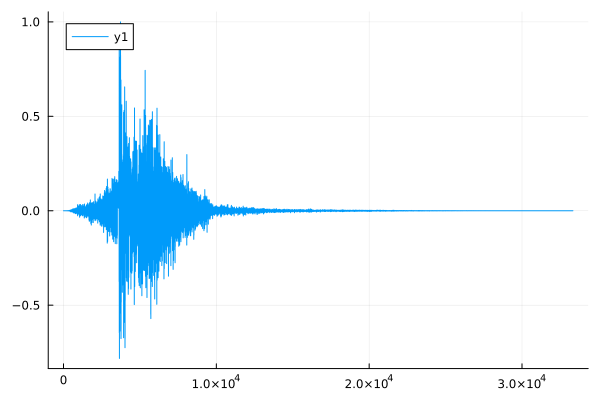

In [79]:
# draw signal
plot(samp[:,1])

In [80]:
x = convert(Array,samp[:,1]);

In [81]:
FFT_1d_Naive = function (x)
    N = length(x)
    if N % 2 > 0
        error("length must be a power of 2")
        exit(1)
    elseif N <= 2
        n = 0:(N-1)
        M = exp.(-2im * pi * (n * transpose(n))/N)
        return M * x
    else 
        X_odd = FFT_1d_Naive(x[1:2:length(x)])
        X_even = FFT_1d_Naive(x[2:2:length(x)])  
        terms = exp.(-2im * pi * (0:(N-1)) / N)
        return vcat(X_odd + (*).(terms[1:convert(Int,(N/2))],X_even) , X_even + (*).(terms[convert(Int,(N/2))+1:length(x)],X_odd))
    end
end

#15 (generic function with 1 method)

In [87]:
@time X = FFT_1d_Naive(x[1:2^15]);

  0.103872 seconds (327.83 k allocations: 59.565 MiB, 9.51% gc time)


In [88]:
sr = 44100;

xdft = X[1:convert(Int,length(X)/2+1)];

DF = sr/length(X);
freq = 0:DF:sr/2;

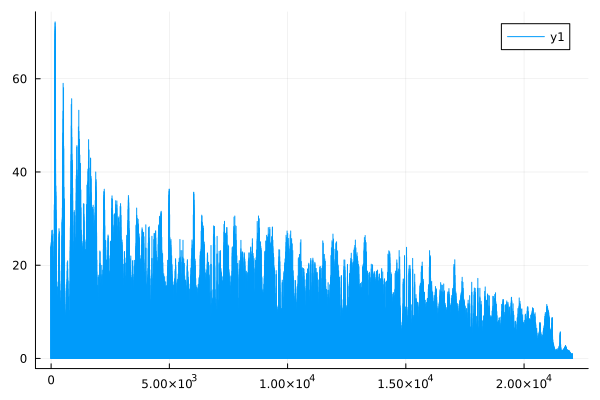

In [89]:
plot(freq,abs.(xdft), line=:stem)

In [90]:
using FFTW

In [104]:
sr = 44100;

xdft = X[1:convert(Int,round(length(X)/2+1))];

DF = sr/length(X);
freq = 0:DF:sr/2;

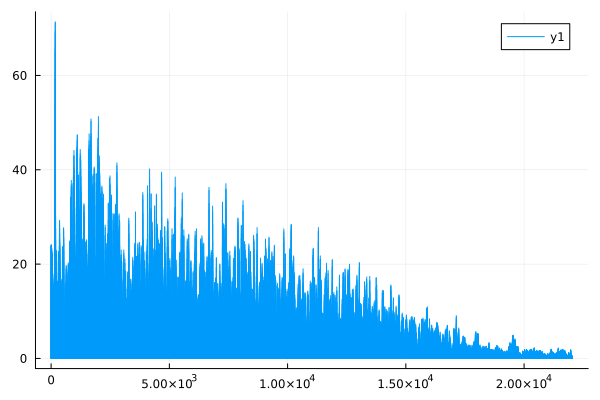

In [105]:
plot(freq,abs.(xdft), line=:stem)